In [1]:
import scanpy as sc
import scFates as scf
import warnings
warnings.filterwarnings("ignore")
adata = sc.read("adata_final.h5ad")

scf.set_figure_pubready()

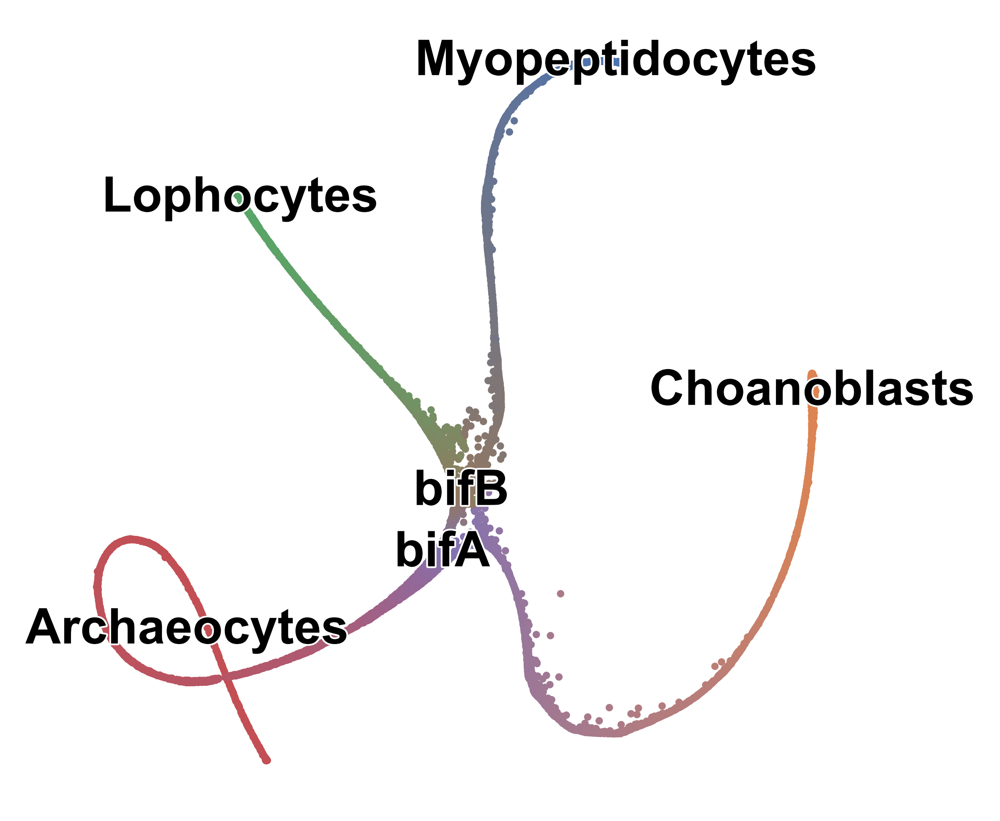

In [2]:
sc.set_figure_params(frameon=False,dpi=300)
scf.pl.milestones(adata,annotate=True,title="",save="overview.pdf")

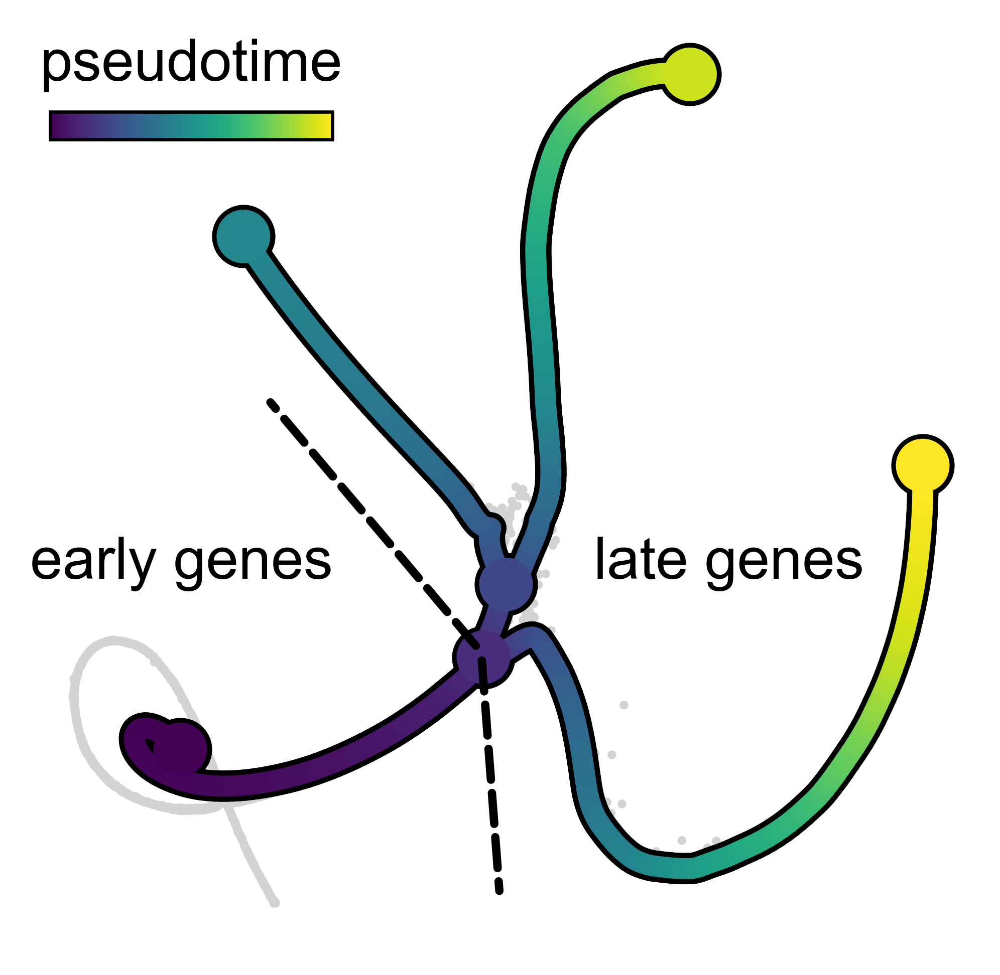

In [56]:
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm
sc.set_figure_params(dpi=300,frameon=False)
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
ax=scf.pl.trajectory(adata,frameon=False,show=False)
cbaxes = inset_axes(ax, width="30%", height="3%",bbox_to_anchor=(-0.65, -0.06, 1, 1),
                      bbox_transform=ax.transAxes) 

cb1 = matplotlib.colorbar.ColorbarBase(cbaxes, cmap=cm.viridis,
                                orientation='horizontal'  ,ticklocation="top",                    
                                ticks=[],label="pseudotime",
                                )
ax.annotate("",xy=(0.5,.05),xytext=(0.48,0.32),xycoords="axes fraction",
  arrowprops={"arrowstyle":"-","linestyle":"--","linewidth":2},zorder=10000)

ax.annotate("",xy=(0.25,0.6),xytext=(0.48,0.32),xycoords="axes fraction",
  arrowprops={"arrowstyle":"-","linestyle":"--","linewidth":2},zorder=10000)

ax.annotate("early genes",xy=(0,0.4),xycoords="axes fraction",zorder=10000,size=14)
ax.annotate("late genes",xy=(0.6,0.4),xycoords="axes fraction",zorder=10000,size=14)

plt.savefig("figures/early_pseudotime.pdf")

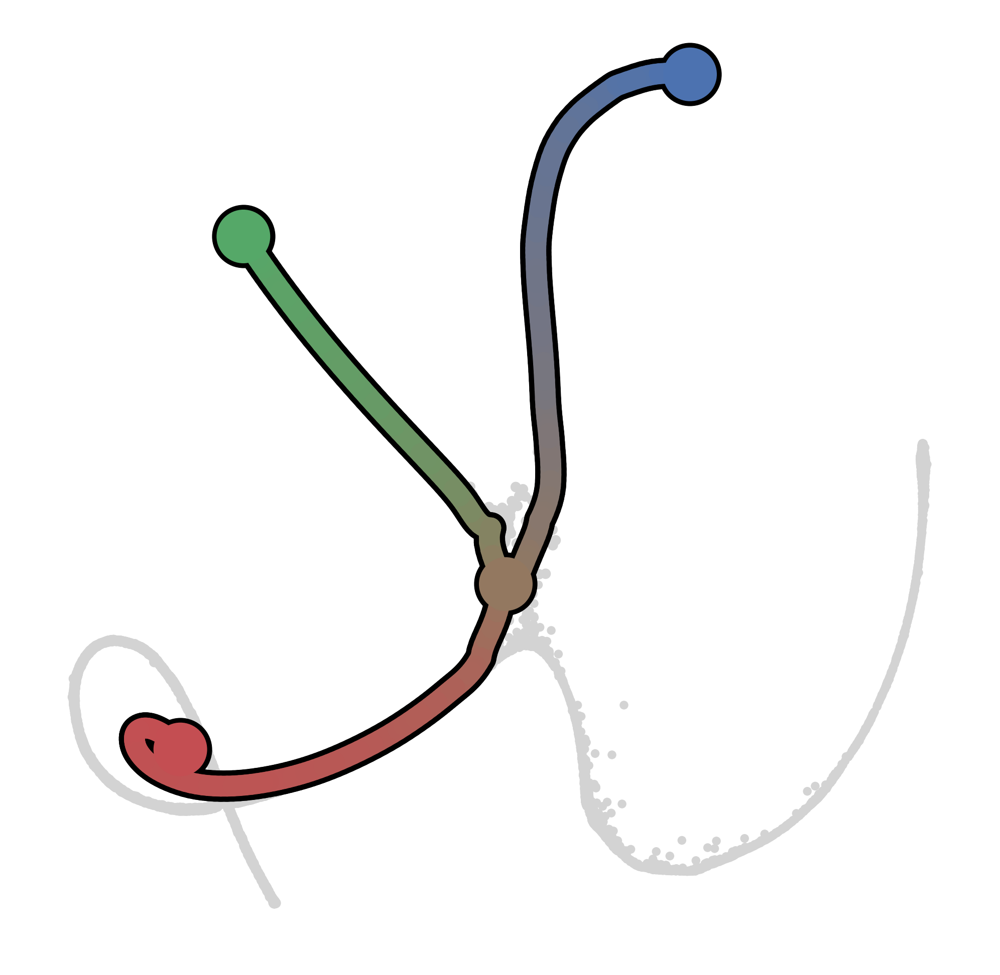

In [4]:
root="Archaeocytes"
miles=["Myopeptidocytes","Lophocytes"]
scf.pl.trajectory(adata,basis="draw_graph_fa",
                  root_milestone=root,milestones=miles,color_seg="milestones",save="bifA.pdf")

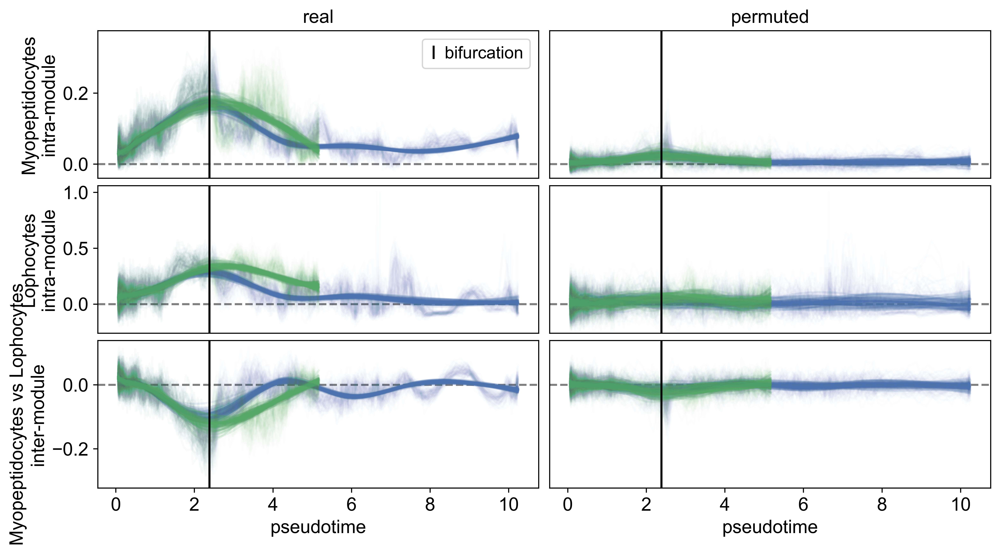

In [5]:
root="Archaeocytes"
miles=["Myopeptidocytes","Lophocytes"]
scf.pl.synchro_path(adata,root,miles,save="sync1.pdf")

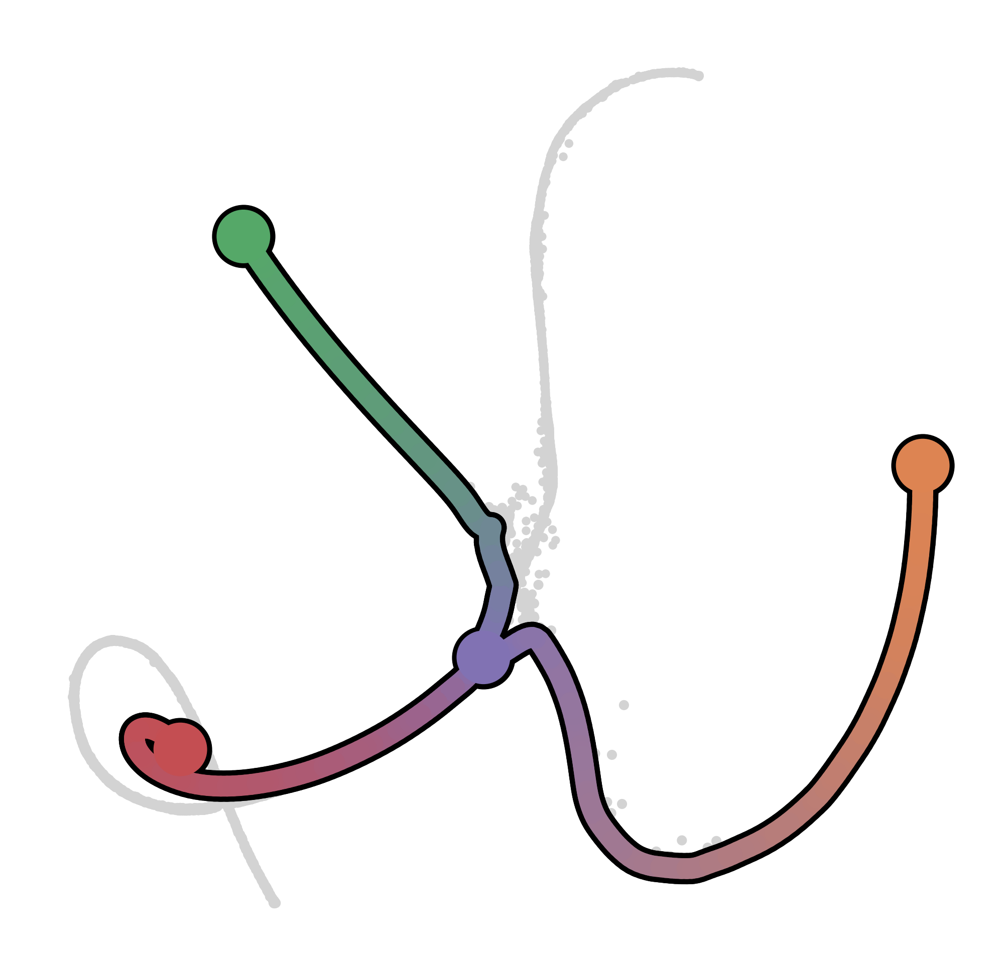

In [6]:
miles=["Choanoblasts","Lophocytes"]
scf.pl.trajectory(adata,basis="draw_graph_fa",
                  root_milestone=root,milestones=miles,color_seg="milestones",save="bifB.pdf")

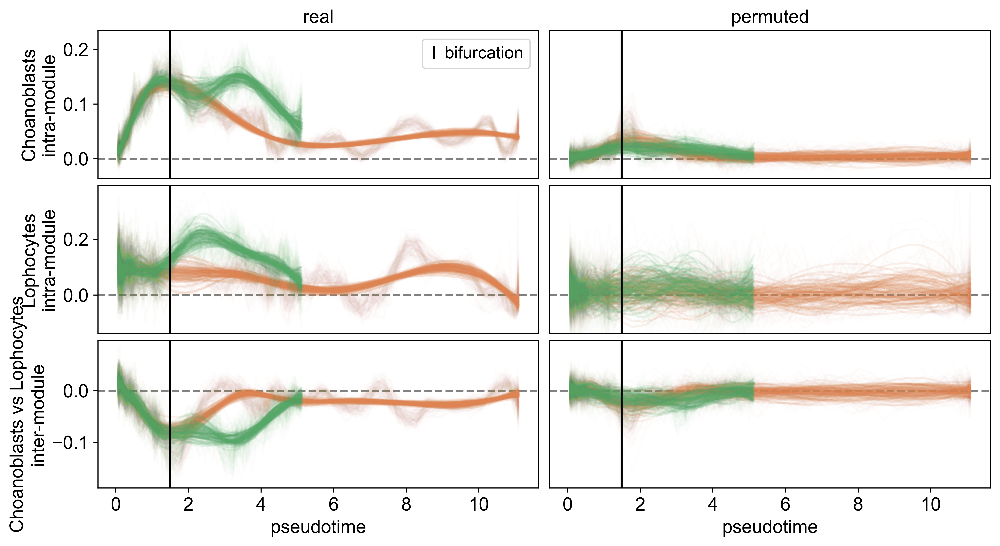

In [7]:
scf.pl.synchro_path(adata,root,miles,save="sync2.pdf")

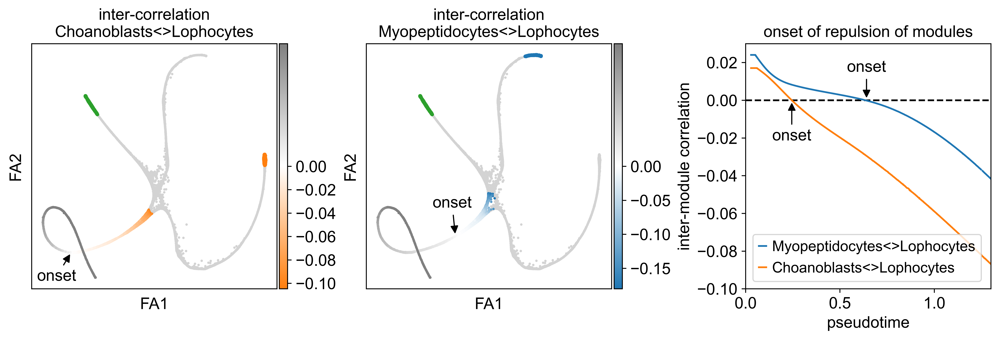

In [8]:
from matplotlib.colors import LinearSegmentedColormap
import numpy as np
sc.set_figure_params(dpi=300,frameon=True)
cmap_A=LinearSegmentedColormap.from_list("a",["tab:orange","white","grey"])
cmap_B=LinearSegmentedColormap.from_list("a",["tab:blue","white","grey"])
fig,(ax1,ax2,ax3)=plt.subplots(1,3,figsize=(12,4),constrained_layout=True)
tip1=adata.obs.t[adata.obs.milestones=="Myopeptidocytes"].sort_values(ascending=False)[:200].index
tip2=adata.obs.t[adata.obs.milestones=="Lophocytes"].sort_values(ascending=False)[:200].index
tip3=adata.obs.t[adata.obs.milestones=="Choanoblasts"].sort_values(ascending=False)[:200].index


sc.pl.draw_graph(adata,color="inter_cor Archaeocytes->Choanoblasts<>Lophocytes",ax=ax1,
                 title="inter-correlation\nChoanoblasts<>Lophocytes",cmap=cmap_A,vcenter=0,show=False)
ax1.scatter(adata[tip3].obsm["X_draw_graph_fa"][:,0],
           adata[tip3].obsm["X_draw_graph_fa"][:,1],
           c="tab:orange",s=5)

ax1.scatter(adata[tip2].obsm["X_draw_graph_fa"][:,0],
           adata[tip2].obsm["X_draw_graph_fa"][:,1],
           c="tab:green",s=5)

bol=adata.obs["inter_cor Archaeocytes->Choanoblasts<>Lophocytes"][adata.obs.t.sort_values().index]<0
tA=adata.obs.t.sort_values()[np.argwhere(bol.values)[0][0]]
cell_annot=adata.obs.t.sort_values().index[np.argwhere(bol.values)[0][0]]

ax1.annotate("onset",xy=(adata[cell_annot].obsm["X_draw_graph_fa"][:,0],
                      adata[cell_annot].obsm["X_draw_graph_fa"][:,1]),
            xytext=(-30, -25), textcoords='offset points',arrowprops=dict(arrowstyle="-|>", color='black'))

sc.pl.draw_graph(adata,color="inter_cor Archaeocytes->Myopeptidocytes<>Lophocytes",ax=ax2,
                title="inter-correlation\nMyopeptidocytes<>Lophocytes",cmap=cmap_B,vcenter=0,show=False)
ax2.scatter(adata[tip1].obsm["X_draw_graph_fa"][:,0],
           adata[tip1].obsm["X_draw_graph_fa"][:,1],
           c="tab:blue",s=5)

ax2.scatter(adata[tip2].obsm["X_draw_graph_fa"][:,0],
           adata[tip2].obsm["X_draw_graph_fa"][:,1],
           c="tab:green",s=5)

bol=adata.obs["inter_cor Archaeocytes->Myopeptidocytes<>Lophocytes"][adata.obs.t.sort_values().index]<0
tB=adata.obs.t.sort_values()[np.argwhere(bol.values)[0][0]]
cell_annot=adata.obs.t.sort_values().index[np.argwhere(bol.values)[0][0]]

ax2.annotate("onset",xy=(adata[cell_annot].obsm["X_draw_graph_fa"][:,0],
                      adata[cell_annot].obsm["X_draw_graph_fa"][:,1]),
            xytext=(-20, 25), textcoords='offset points',arrowprops=dict(arrowstyle="-|>", color='black'))


import matplotlib.pyplot as plt
sort=adata.obs.t.sort_values().index

ax3.axhline(0,c="k",linestyle="--")
ax3.plot(adata.obs.t[sort],adata.obs["inter_cor Archaeocytes->Myopeptidocytes<>Lophocytes"][sort],
       label="Myopeptidocytes<>Lophocytes")
ax3.plot(adata.obs.t[sort],adata.obs["inter_cor Archaeocytes->Choanoblasts<>Lophocytes"][sort],
       label="Choanoblasts<>Lophocytes")
ax3.set_xlim([0,1.3])
ax3.set_ylim([-.1,0.03])
ax3.legend()
ax3.set_xlabel("pseudotime")
ax3.set_ylabel("inter-module correlation")

ax3.annotate("onset",xy=(tA,0),xytext=(0, -35),ha="center",
             textcoords='offset points',arrowprops=dict(arrowstyle="-|>", color='black'))

ax3.annotate("onset",xy=(tB,0),xytext=(0, 25),ha="center",
             textcoords='offset points',arrowprops=dict(arrowstyle="-|>", color='black'))

ax3.set_title("onset of repulsion of modules");
ax3.grid(False)

plt.savefig("figures/onset.pdf")

In [2]:
import sys
import numpy as np
fname="fig"
path="/".join(np.array(sys.executable.split("/"))[:-1])

In [14]:
%%bash -s $fname $path
cat<<EOF >$1.tex
\documentclass{article}
\usepackage[paperheight=250mm,paperwidth=210mm]{geometry}
\geometry{left=5mm,right=5mm,top=5mm,bottom=5mm,}
 
\usepackage[labelfont=bf]{caption}
\usepackage[rgb]{xcolor}
\usepackage{fontspec}
\usepackage[utf8]{inputenc}
\usepackage[T1]{fontenc}
\usepackage{graphbox,graphicx} 
\usepackage{adjustbox}

\begin{document}
\setmainfont{Arial}

\noindent
\normalsize 

\fontsize{13pt}{13pt}\selectfont


\raggedright \begin{minipage}[t]{.35\textwidth}
\raggedright \textbf{a} Published sponge dataset

\vspace{1ex}

\includegraphics[width=\textwidth]{figures/milestonesoverview.pdf}
\end{minipage}\hfill
\begin{minipage}[t]{.65\textwidth}
\raggedright \textbf{c} intra/inter-module correlation for Myopeptidocytes vs Lophocytes bifurcation\\
\includegraphics[width=\textwidth]{figures/synchro_pathsync1.pdf}
\end{minipage}\hfill

\raggedright \begin{minipage}[t]{.35\textwidth}
\raggedright \textbf{b} Trajectory fitted to data

\vspace{1ex}

\includegraphics[width=\textwidth]{figures/early_pseudotime.pdf}
\end{minipage}\hfill
\begin{minipage}[t]{.65\textwidth}
\raggedright \textbf{d} intra/inter-module correlation for Choanoblasts vs Lophocytes bifurcation\\
\includegraphics[width=\textwidth]{figures/synchro_pathsync2.pdf}
\end{minipage}\hfill

\vspace{1ex}

\raggedright \textbf{e} Consecutive onset of repuslion of early gene modules

\vspace{1ex}

\includegraphics[width=\textwidth]{figures/onset.pdf}

\clearpage
EOF
echo "\end{document}" >> $1.tex

$2/tectonic -c minimal $1.tex

$2/identify $1.pdf

$2/convert -flatten -density 300 $1.pdf $1.jpg

fig.pdf PDF 612x792 612x792+0+0 16-bit sRGB 3511B 0.000u 0:00.000


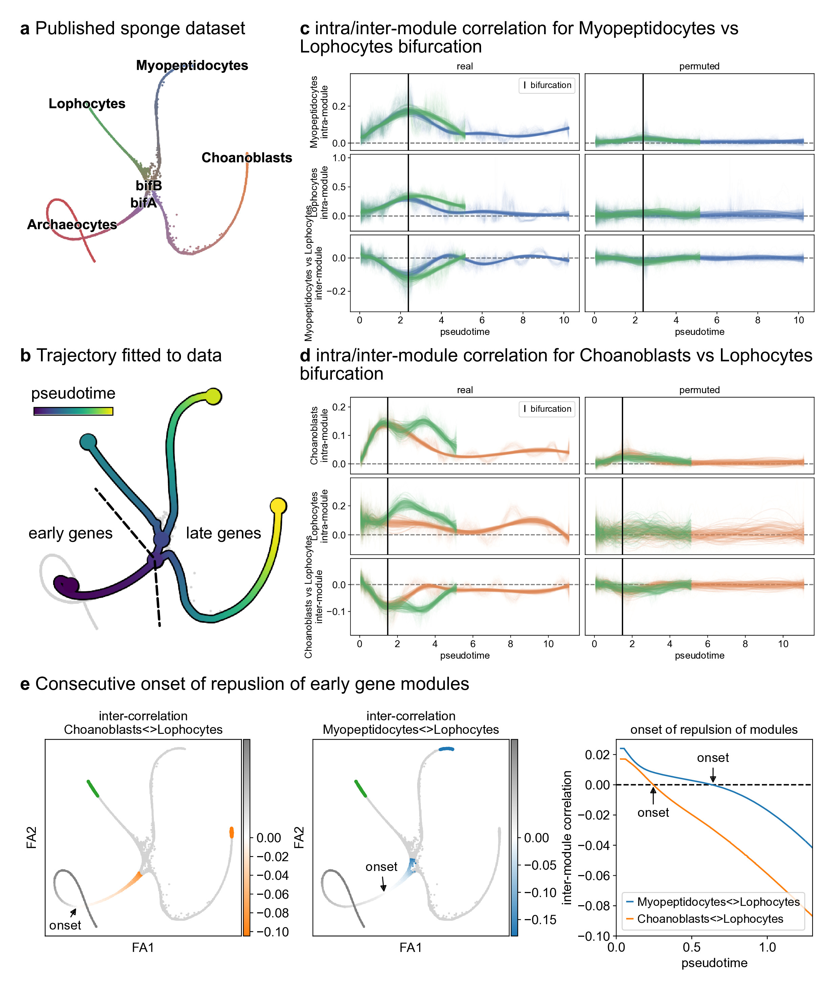

In [15]:
from IPython.display import Image
Image(filename=f'{fname}.jpg')